# Fruit Freshness Classifier

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import numpy as np
import os

In [2]:
# Define constants
data_dir = "../DATA"
img_height = 224
img_width = 224
batch_size = 32

# Function to map fruit class labels to binary labels (fresh=0, spoiled=1)
def map_to_binary_class(images, labels):
    # Use string matching to determine binary labels
    binary_labels = tf.where(labels % 2 == 0, 0, 1)  # Adjusted for binary split of fresh vs spoiled
    return images, binary_labels

# Load the raw dataset
raw_train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    label_mode="int",  # Labels will be integers
    validation_split=0.2,
    subset="training",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

raw_val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    label_mode="int",  # Labels will be integers
    validation_split=0.2,
    subset="validation",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

Found 16000 files belonging to 8 classes.
Using 12800 files for training.
Found 16000 files belonging to 8 classes.
Using 3200 files for validation.


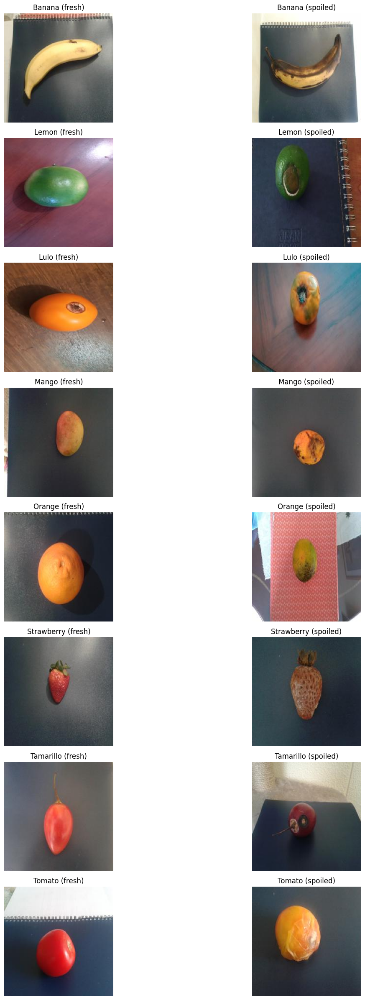

Visualization saved to: ../OUTPUT/ANALYSIS\fruit_visualization.png


In [16]:
output_dir = "../OUTPUT/ANALYSIS"

# Ensure the OUTPUT directory exists
os.makedirs(output_dir, exist_ok=True)

# Define categories and automatically detect fruit names
categories = ['fresh', 'spoiled']
fruits = sorted(os.listdir(data_dir))  # Automatically detect fruit folders

# Plot one fresh and one spoiled image for each fruit
plt.figure(figsize=(12, len(fruits) * 3))  # Dynamic figure size based on number of fruits
index = 1

for fruit in fruits:
    for category in categories:
        # Construct the full path to the images
        folder_path = os.path.join(data_dir, fruit, category)
        if os.path.exists(folder_path) and len(os.listdir(folder_path)) > 0:
            # Get the first image from the folder
            image_path = os.path.join(folder_path, os.listdir(folder_path)[0])
            img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
            img_array = tf.keras.preprocessing.image.img_to_array(img)

            # Plot the image
            ax = plt.subplot(len(fruits), 2, index)
            plt.imshow(img_array.astype("uint8"))
            plt.title(f"{fruit.capitalize()} ({category})")
            plt.axis("off")
            index += 1

# Save the plot to the OUTPUT directory
output_path = os.path.join(output_dir, "fruit_visualization.png")
plt.tight_layout()
plt.savefig(output_path, dpi=300)  # Save with high resolution
plt.show()  # Display the plot
plt.close()  # Close the plot to free memory

print(f"Visualization saved to: {output_path}")


In [4]:
# Map labels to binary classes
train_ds = raw_train_ds.map(map_to_binary_class)
val_ds = raw_val_ds.map(map_to_binary_class)

# Prefetch data for performance optimization
train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

# Build the model
base_model = ResNet50(
    weights="imagenet",
    include_top=False,
    input_shape=(img_height, img_width, 3)
)
base_model.trainable = False

# Add custom layers
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation="relu"),
    Dropout(0.5),
    Dense(1, activation="sigmoid")  # Single output for binary classification
])

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="binary_crossentropy",  # Binary cross-entropy for binary labels
    metrics=["accuracy"]
)

# Model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,850,113 (90.98 MB)

 Trainable params: 262,401 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [5]:
# Train the model (Phase 1)
history_phase1 = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    verbose=1
)

Epoch 1/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 271s 668ms/step - accuracy: 0.8963 - loss: 0.2508 - val_accuracy: 0.9859 - val_loss: 0.0393
Epoch 2/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 264s 661ms/step - accuracy: 0.9809 - loss: 0.0473 - val_accuracy: 0.9922 - val_loss: 0.0201
Epoch 3/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 422s 1s/step - accuracy: 0.9928 - loss: 0.0218 - val_accuracy: 0.9975 - val_loss: 0.0108
Epoch 4/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 463s 1s/step - accuracy: 0.9916 - loss: 0.0278 - val_accuracy: 0.9962 - val_loss: 0.0083
Epoch 5/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 739s 2s/step - accuracy: 0.9947 - loss: 0.0132 - val_accuracy: 0.9987 - val_loss: 0.0053
Epoch 6/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 808s 2s/step - accuracy: 0.9951 - loss: 0.0143 - val_accuracy: 0.9956 - val_loss: 0.0098
Epoch 7/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 257s 644ms/step - accuracy: 0.9948 - loss: 0.0147 - val_accuracy: 0.9969 - val_loss: 0.0089
Epoch 8/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 311s 778ms/step - accuracy: 0.9947 - loss: 0.015

In [7]:
# Fine-tune the model (Phase 2)
base_model.trainable = True
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss="binary_crossentropy",
    metrics=["accuracy"]
)

history_phase2 = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=3,
    verbose=1
)

Epoch 1/3
400/400 ━━━━━━━━━━━━━━━━━━━━ 1128s 3s/step - accuracy: 0.9769 - loss: 0.0855 - val_accuracy: 0.9978 - val_loss: 0.0045
Epoch 2/3
400/400 ━━━━━━━━━━━━━━━━━━━━ 1108s 3s/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 1.0000 - val_loss: 7.0846e-04
Epoch 3/3
400/400 ━━━━━━━━━━━━━━━━━━━━ 1641s 4s/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.9991 - val_loss: 0.0016


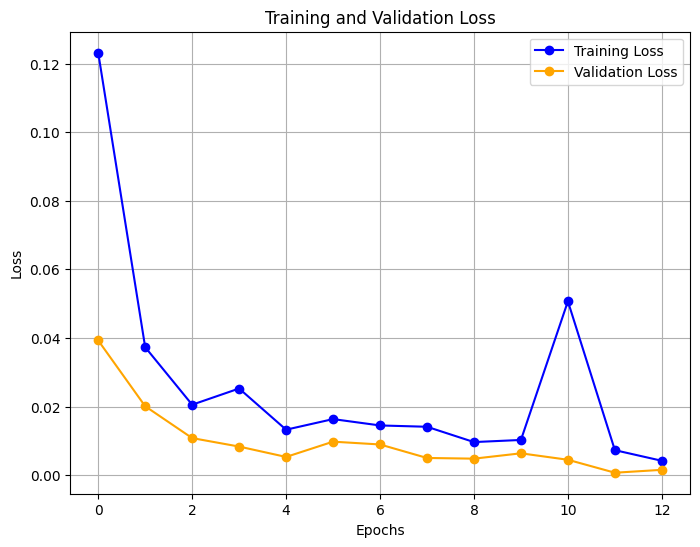

Loss plot saved to: ../OUTPUT/ANALYSIS\training_validation_loss.png


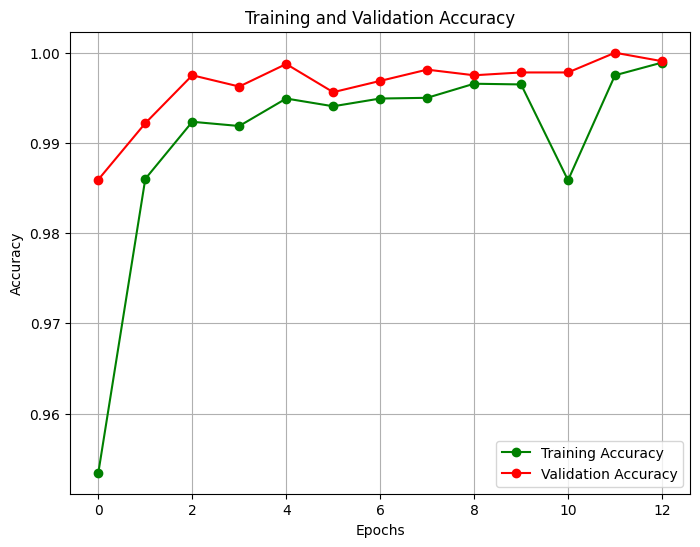

Accuracy plot saved to: ../OUTPUT/ANALYSIS\training_validation_accuracy.png


In [17]:
def plot_training_history(history_phase1, history_phase2):
    # Combine history for both phases
    loss = history_phase1.history['loss'] + history_phase2.history['loss']
    val_loss = history_phase1.history['val_loss'] + history_phase2.history['val_loss']
    accuracy = history_phase1.history['accuracy'] + history_phase2.history['accuracy']
    val_accuracy = history_phase1.history['val_accuracy'] + history_phase2.history['val_accuracy']

    # Loss Plot
    plt.figure(figsize=(8, 6))
    plt.plot(loss, label='Training Loss', marker='o', color='blue')  # Changed to blue
    plt.plot(val_loss, label='Validation Loss', marker='o', color='orange')  # Changed to orange
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid(True)

    # Save the loss plot
    loss_plot_path = os.path.join(output_dir, "training_validation_loss.png")
    plt.savefig(loss_plot_path, dpi=300)
    plt.show()
    print(f"Loss plot saved to: {loss_plot_path}")

    # Accuracy Plot
    plt.figure(figsize=(8, 6))
    plt.plot(accuracy, label='Training Accuracy', marker='o', color='green')  # Changed to green
    plt.plot(val_accuracy, label='Validation Accuracy', marker='o', color='red')  # Changed to red
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.grid(True)

    # Save the accuracy plot
    accuracy_plot_path = os.path.join(output_dir, "training_validation_accuracy.png")
    plt.savefig(accuracy_plot_path, dpi=300)
    plt.show()
    print(f"Accuracy plot saved to: {accuracy_plot_path}")

# Call the function to plot and save
plot_training_history(history_phase1, history_phase2)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

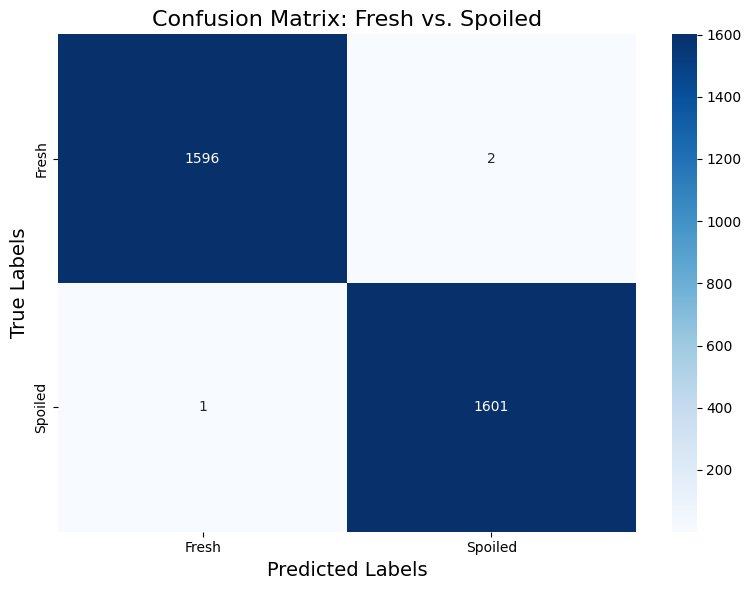

Confusion matrix saved to: ../OUTPUT/ANALYSIS\fresh_vs_spoiled_confusion_matrix.png


In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def generate_confusion_matrix(model, dataset, output_dir):
    """
    Generate and save a confusion matrix for fresh vs. spoiled classification.
    """
    true_labels = []
    predicted_labels = []

    # Collect true labels and predictions
    for images, labels in dataset:
        predictions = model.predict(images).flatten()
        predicted_classes = (predictions > 0.5).astype("int32").flatten()

        true_labels.extend(labels.numpy())
        predicted_labels.extend(predicted_classes)

    # Generate confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)
    class_names = ['Fresh', 'Spoiled']  # Define class names

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Labels', fontsize=14)
    plt.ylabel('True Labels', fontsize=14)
    plt.title('Confusion Matrix: Fresh vs. Spoiled', fontsize=16)
    plt.tight_layout()

    # Save the confusion matrix to the output directory
    output_path = os.path.join(output_dir, "fresh_vs_spoiled_confusion_matrix.png")
    plt.savefig(output_path, dpi=300)
    plt.show()

    print(f"Confusion matrix saved to: {output_path}")

# Call the function
generate_confusion_matrix(model, val_ds, output_dir)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

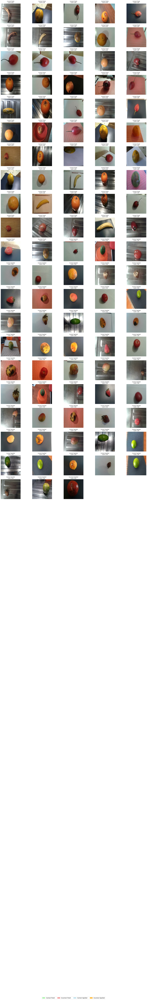

Classified images grid with key saved to: ../OUTPUT/ANALYSIS\classified_images_grid_key.png


In [36]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import os
import numpy as np

def generate_visualization_grid_with_key(model, dataset, output_dir, num_examples=50):
    """
    Generate and save a grid of classified images with up to 50 examples per category, arranged in 5 images per row.
    """
    correct_fresh = []
    incorrect_fresh = []
    correct_spoiled = []
    incorrect_spoiled = []

    # Collect predictions and sort images into categories
    for images, labels in dataset:
        predictions = model.predict(images).flatten()
        predicted_classes = (predictions > 0.5).astype("int32").flatten()

        for i in range(len(images)):
            true_label = labels[i].numpy()
            predicted_label = predicted_classes[i]

            if true_label == 0 and predicted_label == 0:  # Correct Fresh
                correct_fresh.append((images[i], predictions[i]))
            elif true_label == 0 and predicted_label == 1:  # Incorrect Fresh
                incorrect_fresh.append((images[i], predictions[i]))
            elif true_label == 1 and predicted_label == 1:  # Correct Spoiled
                correct_spoiled.append((images[i], predictions[i]))
            elif true_label == 1 and predicted_label == 0:  # Incorrect Spoiled
                incorrect_spoiled.append((images[i], predictions[i]))

            # Stop collecting once we have enough examples for each category
            if (
                len(correct_fresh) >= num_examples and
                len(incorrect_fresh) >= num_examples and
                len(correct_spoiled) >= num_examples and
                len(incorrect_spoiled) >= num_examples
            ):
                break

    # Prepare the categories and their labels
    categories = {
        "Correct Fresh": correct_fresh,
        "Incorrect Fresh": incorrect_fresh,
        "Correct Spoiled": correct_spoiled,
        "Incorrect Spoiled": incorrect_spoiled,
    }
    category_colors = {
        "Correct Fresh": "lightgreen",
        "Incorrect Fresh": "lightcoral",
        "Correct Spoiled": "lightblue",
        "Incorrect Spoiled": "orange",
    }

    # Configure the grid layout
    rows_per_category = (num_examples + 4) // 5  # 5 images per row
    total_rows = rows_per_category * len(categories)
    cols = 5  # 5 images per row

    plt.figure(figsize=(20, total_rows * 3))

    index = 1

    for category, images in categories.items():
        for img, confidence in images[:num_examples]:
            ax = plt.subplot(total_rows, cols, index)
            plt.imshow(img.numpy().astype("uint8"))
            plt.title(f"{category}\nConf: {confidence:.2f}", fontsize=10)
            plt.axis("off")
            index += 1

    # Add a legend at the bottom
    legend_patches = [
        mpatches.Patch(color=color, label=category)
        for category, color in category_colors.items()
    ]
    plt.figlegend(
        handles=legend_patches,
        loc="lower center",
        ncol=len(categories),
        bbox_to_anchor=(0.5, -0.05),
        fontsize=12,
    )

    plt.tight_layout()

    # Save the visualization to the output directory
    output_path = os.path.join(output_dir, "classified_images_grid_key.png")
    plt.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Classified images grid with key saved to: {output_path}")

# Call the function
generate_visualization_grid_with_key(model, val_ds, output_dir, num_examples=50)

